# Bitcoin price prediction using machine learning models and trading strategy model 
# Author: Akinkunle Akinola

Despite the success stories about the Bitcoin market, we are ultimately aware of its have downfalls. It is well-known that the prices of  cryptocurrencies rise and fall over a short period of time. This price volatility tends to scare some traders who are afraid of losing money invested in the market.
This project will use time series analysis to predict the price of Bitcoin over a period of time using market data and a proprietary alerts data set. 

The business goal is to build a predictive model that will give an insight on when, how and what to trade at a particular time to maximize return on investment capital and help traders make better trading decisions.



# Import libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.model_selection import train_test_split
# from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn import metrics
import statsmodels.api as sm

import pylab as py
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification
from sklearn.metrics import plot_confusion_matrix
from sklearn.svm import SVC
from sklearn.metrics import roc_curve
import seaborn as sns

from sklearn.metrics import plot_confusion_matrix


# Import Data

In [2]:
Alert_data = pd.read_excel('alerts_created.xlsx')
Alert_data.head()
Alert_data.shape

(102225, 23)

In [3]:
Alert_data['data'] = Alert_data['data'].astype(str) + Alert_data['is_active'].astype(str) + Alert_data['is_deleted'].astype(str)
Alert_data.head()

,id,user_id,type,market,currency,data,is_active,is_deleted,max_notifications,notifications,...,updated_at,deleted_at,last_checked,last_sent,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22
0,3,1343,price_point,POLONIEX,XRP_USD,"{\comparison\"":\""sell_price\""\""value\"":\""0.32\...","\""value\"":\""0.32\""","\""operator\"":\"">=\""}""",1,0,...,NaN,2017-01-17 07:45:21,2019-07-12 22:29:03,NaN,NaT,NaT,NaT,NaN,NaN,NaN
1,5,1344,price_point,BITTREX,BTC_TRIG,"{\comparison\"":\""buy_price\""\""value\"":\"".00000...","\""value\"":\"".0000071\""","\""operator\"":\"">=\""}""",0,0,...,NaN,2017-01-17 08:45:31,2017-01-17 08:46:26,NaN,NaT,NaT,NaT,NaN,NaN,NaN
2,6,1345,regular_update,BITSTAMP,BTC_EUR,"{\comparison\"":\""buy_price\""\""value\"":\""1day\""}""0","\""value\"":\""1day\""}""",0,0,NaN,...,2017-01-17 08:50:15,2017-03-31 23:00:19,NaN,NaN,NaT,NaT,NaT,NaN,NaN,NaN
3,7,1348,price_point,BITSTAMP,BTC_EUR,"{\comparison\"":\""buy_price\""\""value\"":\""600\""\...","\""value\"":\""600\""","\""operator\"":\""<=\""}""",0,1,...,NaN,2017-01-17 12:11:20,2019-01-06 03:06:52,2018-04-29 08:40:49,NaT,NaT,NaT,NaN,NaN,NaN
4,8,1348,price_point,BITSTAMP,BTC_USD,"{\comparison\"":\""buy_price\""\""value\"":\""650\""\...","\""value\"":\""650\""","\""operator\"":\""<=\""}""",0,1,...,NaN,2017-01-17 12:11:43,2018-04-29 08:40:45,2018-04-29 08:40:45,NaT,NaT,NaT,NaN,NaN,NaN


In [4]:
Alert_data = Alert_data.drop('is_active', axis = 1)
Alert_data = Alert_data.drop('is_deleted', axis = 1)

In [5]:
Alert_data.columns = ['id', 'user_id', 'type', 'market', 'currency', 'data', 'is_active',
       'is_deleted', 'max_notifications', 'notifications', 'snooze',
       'custom_message', 'created_at', 'updated_at', 'deleted_at',
       'last_checked', 'last_sent', 'Unnamed: 17', 'Unnamed: 18',
       'Unnamed: 19', 'Unnamed: 20']

In [6]:
Alert_data = Alert_data.drop(Alert_data.columns[[11, 17, 18, 19, 20]], axis = 1)

# Subsetting Over Price Point

In [7]:
Alert_price_point = Alert_data[Alert_data['type'] == 'price_point']
Alert_price_point = Alert_price_point.reset_index()

In [8]:
Alert_price_point = Alert_price_point.drop('index', axis = 1)

# Splitting 'Data' Column

In [9]:
import json
# val = Alert_price_point.iloc[0]["data"]
# print(val)
def convert_str_to_proper_dict(val):
  val = r'"' + val
  val = val[:3] + '"' + val[3:]
  val = val.replace(r'\"\"', r'\",\"')
  val = val.replace('null', 'null,')
  val = "".join(val.split())
  return json.loads(json.loads(val))

In [10]:
q = list(Alert_price_point["data"])
for idx, val in enumerate(q):
  try:
    convert_str_to_proper_dict(val)
  except:
    print(f"idx is {idx}")
    break

In [11]:
print(q[23811].strip())
convert_str_to_proper_dict(q[23811])

{\comparison\":\"buy_price\"\"value\":\"	0.0009\"\"operator\":\">=\"}"


{'comparison': 'buy_price', 'value': '0.0009', 'operator': '>='}

In [12]:
Alert_price_point["data"] = Alert_price_point["data"].apply(convert_str_to_proper_dict)

In [13]:
json_df = pd.json_normalize(Alert_price_point["data"])
# json_df

# Merging the splitted column back to the original data

In [14]:
JSON_price_point_df = pd.concat([Alert_price_point, json_df], axis = 1)
JSON_price_point_df.head()

,id,user_id,type,market,currency,data,is_active,is_deleted,max_notifications,notifications,snooze,created_at,updated_at,deleted_at,last_checked,last_sent,comparison,value,operator
0,3,1343,price_point,POLONIEX,XRP_USD,"{'comparison': 'sell_price', 'value': '0.32', ...",1,0,6,4,5min,2017-01-17 07:45:21,2019-07-12 22:29:03,NaN,NaT,NaT,sell_price,0.32,>=
1,5,1344,price_point,BITTREX,BTC_TRIG,"{'comparison': 'buy_price', 'value': '.0000071...",0,0,1,0,5min,2017-01-17 08:45:31,2017-01-17 08:46:26,NaN,NaT,NaT,buy_price,.0000071,>=
2,7,1348,price_point,BITSTAMP,BTC_EUR,"{'comparison': 'buy_price', 'value': '600', 'o...",0,1,1,2,5min,2017-01-17 12:11:20,2019-01-06 03:06:52,2018-04-29 08:40:49,NaT,NaT,buy_price,600,<=
3,8,1348,price_point,BITSTAMP,BTC_USD,"{'comparison': 'buy_price', 'value': '650', 'o...",0,1,1,2,5min,2017-01-17 12:11:43,2018-04-29 08:40:45,2018-04-29 08:40:45,NaT,NaT,buy_price,650,<=
4,9,1348,price_point,KRAKEN,LTC_EUR,"{'comparison': 'buy_price', 'value': '2.5', 'o...",0,1,1,0,5min,2017-01-17 12:13:31,2018-04-29 08:40:40,2018-04-29 08:40:40,NaT,NaT,buy_price,2.5,<=


In [15]:
JSON_price_point_df['created_at'] = pd.to_datetime(JSON_price_point_df['created_at'])

In [16]:
JSON_price_point_df.shape

(80512, 19)

# Checking for null values

In [17]:
JSON_price_point_df.isnull().sum().sum()

212670

# Dropping irrelevant columns

In [18]:
JSON_price_point_df = JSON_price_point_df.drop(JSON_price_point_df.columns[[12, 13, 14, 15]], axis = 1)
JSON_price_point_df = JSON_price_point_df.drop(JSON_price_point_df.columns[[5]], axis = 1)
JSON_price_point_df.head()

,id,user_id,type,market,currency,is_active,is_deleted,max_notifications,notifications,snooze,created_at,comparison,value,operator
0,3,1343,price_point,POLONIEX,XRP_USD,1,0,6,4,5min,2017-01-17 07:45:21,sell_price,0.32,>=
1,5,1344,price_point,BITTREX,BTC_TRIG,0,0,1,0,5min,2017-01-17 08:45:31,buy_price,.0000071,>=
2,7,1348,price_point,BITSTAMP,BTC_EUR,0,1,1,2,5min,2017-01-17 12:11:20,buy_price,600,<=
3,8,1348,price_point,BITSTAMP,BTC_USD,0,1,1,2,5min,2017-01-17 12:11:43,buy_price,650,<=
4,9,1348,price_point,KRAKEN,LTC_EUR,0,1,1,0,5min,2017-01-17 12:13:31,buy_price,2.5,<=


In [19]:
JSON_price_point_df.isnull().sum()

id                     0
user_id                0
type                   0
market                 0
currency             175
is_active              0
is_deleted             0
max_notifications      0
notifications          0
snooze                 0
created_at             0
comparison             0
value                418
operator               0
dtype: int64

# Dropping missing values

In [20]:
clean_JSON_price_point_df = JSON_price_point_df.dropna()
clean_JSON_price_point_df = clean_JSON_price_point_df.reset_index()
clean_JSON_price_point_df.head()

,index,id,user_id,type,market,currency,is_active,is_deleted,max_notifications,notifications,snooze,created_at,comparison,value,operator
0,0,3,1343,price_point,POLONIEX,XRP_USD,1,0,6,4,5min,2017-01-17 07:45:21,sell_price,0.32,>=
1,1,5,1344,price_point,BITTREX,BTC_TRIG,0,0,1,0,5min,2017-01-17 08:45:31,buy_price,.0000071,>=
2,2,7,1348,price_point,BITSTAMP,BTC_EUR,0,1,1,2,5min,2017-01-17 12:11:20,buy_price,600,<=
3,3,8,1348,price_point,BITSTAMP,BTC_USD,0,1,1,2,5min,2017-01-17 12:11:43,buy_price,650,<=
4,4,9,1348,price_point,KRAKEN,LTC_EUR,0,1,1,0,5min,2017-01-17 12:13:31,buy_price,2.5,<=


In [21]:
clean_JSON_price_point_df.isnull().sum()

index                0
id                   0
user_id              0
type                 0
market               0
currency             0
is_active            0
is_deleted           0
max_notifications    0
notifications        0
snooze               0
created_at           0
comparison           0
value                0
operator             0
dtype: int64

# Convert "created_at" column to datetime 

In [22]:
clean_JSON_price_point_df['date'] = pd.to_datetime(clean_JSON_price_point_df['created_at']).dt.date
clean_JSON_price_point_df['time'] = pd.to_datetime(clean_JSON_price_point_df['created_at']).dt.time
clean_JSON_price_point_df.head()

,index,id,user_id,type,market,currency,is_active,is_deleted,max_notifications,notifications,snooze,created_at,comparison,value,operator,date,time
0,0,3,1343,price_point,POLONIEX,XRP_USD,1,0,6,4,5min,2017-01-17 07:45:21,sell_price,0.32,>=,2017-01-17,07:45:21
1,1,5,1344,price_point,BITTREX,BTC_TRIG,0,0,1,0,5min,2017-01-17 08:45:31,buy_price,.0000071,>=,2017-01-17,08:45:31
2,2,7,1348,price_point,BITSTAMP,BTC_EUR,0,1,1,2,5min,2017-01-17 12:11:20,buy_price,600,<=,2017-01-17,12:11:20
3,3,8,1348,price_point,BITSTAMP,BTC_USD,0,1,1,2,5min,2017-01-17 12:11:43,buy_price,650,<=,2017-01-17,12:11:43
4,4,9,1348,price_point,KRAKEN,LTC_EUR,0,1,1,0,5min,2017-01-17 12:13:31,buy_price,2.5,<=,2017-01-17,12:13:31


# Splitting Currency column

In [23]:
d = Alert_price_point['currency'].str.split('_', n = 1, expand = True)
df1 = pd.DataFrame(d)
df1.columns = ["symbol", "currency_2"]

In [24]:
clean_JSON_price_point_df = pd.concat([clean_JSON_price_point_df, df1], axis = 1)

In [25]:
print(clean_JSON_price_point_df.dtypes)
# print(df_crypto_markets.dtypes)

index                       float64
id                          float64
user_id                     float64
type                         object
market                       object
currency                     object
is_active                    object
is_deleted                   object
max_notifications            object
notifications                object
snooze                       object
created_at           datetime64[ns]
comparison                   object
value                        object
operator                     object
date                         object
time                         object
symbol                       object
currency_2                   object
dtype: object


# Importing Market data

In [26]:
df_crypto_markets = pd.read_csv('crypto-markets.csv')
df_crypto_markets.head()
df_crypto_markets.shape

(942297, 13)

In [27]:
df_crypto_markets['date'] = pd.to_datetime(df_crypto_markets['date']).dt.date
clean_JSON_price_point_df['date'] = pd.to_datetime(clean_JSON_price_point_df['date']).dt.date

# Merging Alert data to the market data

In [28]:
alert_merge_df= pd.merge(clean_JSON_price_point_df, df_crypto_markets, how='left', on=['date', 'symbol'])
alert_merge_df.head()

,index,id,user_id,type,market_x,currency,is_active,is_deleted,max_notifications,notifications,...,name,ranknow,open,high,low,close,volume,market_y,close_ratio,spread
0,0.0,3.0,1343.0,price_point,POLONIEX,XRP_USD,1,0,6,4,...,XRP,2.0,0.006772,0.006848,0.006612,0.0068,1842150.0,2.500630e+08,0.7966,0.00
1,1.0,5.0,1344.0,price_point,BITTREX,BTC_TRIG,0,0,1,0,...,Bitcoin,1.0,830.950000,910.560000,830.800000,907.9400,155095008.0,1.462578e+10,0.9672,79.76
2,2.0,7.0,1348.0,price_point,BITSTAMP,BTC_EUR,0,1,1,2,...,Bitcoin,1.0,830.950000,910.560000,830.800000,907.9400,155095008.0,1.462578e+10,0.9672,79.76
3,3.0,8.0,1348.0,price_point,BITSTAMP,BTC_USD,0,1,1,2,...,Bitcoin,1.0,830.950000,910.560000,830.800000,907.9400,155095008.0,1.462578e+10,0.9672,79.76
4,4.0,9.0,1348.0,price_point,KRAKEN,LTC_EUR,0,1,1,0,...,Litecoin,7.0,3.910000,3.950000,3.850000,3.9400,4816480.0,1.945198e+08,0.9000,0.10


In [29]:
alert_merge_df.shape

(80686, 30)

In [30]:
alert_merge_df = alert_merge_df.dropna()

In [31]:
alert_merge_df.isnull().sum()

index                0
id                   0
user_id              0
type                 0
market_x             0
currency             0
is_active            0
is_deleted           0
max_notifications    0
notifications        0
snooze               0
created_at           0
comparison           0
value                0
operator             0
date                 0
time                 0
symbol               0
currency_2           0
slug                 0
name                 0
ranknow              0
open                 0
high                 0
low                  0
close                0
volume               0
market_y             0
close_ratio          0
spread               0
dtype: int64

In [32]:
# checking data types
alert_merge_df.dtypes

index                       float64
id                          float64
user_id                     float64
type                         object
market_x                     object
currency                     object
is_active                    object
is_deleted                   object
max_notifications            object
notifications                object
snooze                       object
created_at           datetime64[ns]
comparison                   object
value                        object
operator                     object
date                         object
time                         object
symbol                       object
currency_2                   object
slug                         object
name                         object
ranknow                     float64
open                        float64
high                        float64
low                         float64
close                       float64
volume                      float64
market_y                    

# Subsetting over Bitcoin (BTC)

In [33]:
alert_BTC = alert_merge_df[alert_merge_df['symbol'] == 'BTC']
alert_BTC = alert_BTC.reset_index()

In [34]:
alert_BTC = alert_BTC.drop('level_0', axis = 1)
alert_BTC = alert_BTC.drop('index', axis = 1)

In [35]:
alert_BTC.head()

,id,user_id,type,market_x,currency,is_active,is_deleted,max_notifications,notifications,snooze,...,name,ranknow,open,high,low,close,volume,market_y,close_ratio,spread
0,5.0,1344.0,price_point,BITTREX,BTC_TRIG,0,0,1,0,5min,...,Bitcoin,1.0,830.95,910.56,830.8,907.94,155095008.0,1.462578e+10,0.9672,79.76
1,7.0,1348.0,price_point,BITSTAMP,BTC_EUR,0,1,1,2,5min,...,Bitcoin,1.0,830.95,910.56,830.8,907.94,155095008.0,1.462578e+10,0.9672,79.76
2,8.0,1348.0,price_point,BITSTAMP,BTC_USD,0,1,1,2,5min,...,Bitcoin,1.0,830.95,910.56,830.8,907.94,155095008.0,1.462578e+10,0.9672,79.76
3,18.0,1171.0,price_point,BTCE,BTC_USD,0,0,1,0,5min,...,Bitcoin,1.0,830.95,910.56,830.8,907.94,155095008.0,1.462578e+10,0.9672,79.76
4,20.0,1331.0,price_point,BITBAYS,BTC_USD,0,0,1,2,5min,...,Bitcoin,1.0,830.95,910.56,830.8,907.94,155095008.0,1.462578e+10,0.9672,79.76


# Exploratory Data Analysis

Text(0, 0.5, 'Frequency')

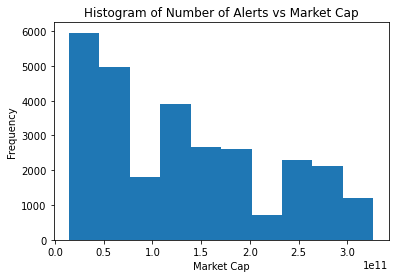

In [36]:
fig = plt.figure()
axes1 = fig.add_subplot(1, 1, 1)
axes1.hist(alert_BTC['market_y'], bins=10)
axes1.set_title('Histogram of Number of Alerts vs Market Cap')
axes1.set_xlabel('Market Cap')
axes1.set_ylabel('Frequency')

# Value counts for each crypto market. Bitcoin is about 45 percent of the data

In [37]:
alert_merge_df['symbol'].value_counts(20).head(20)

BTC     0.453064
ETH     0.134895
LTC     0.068649
USDT    0.055205
XRP     0.048074
BCH     0.021152
TRX     0.018861
EOS     0.009903
ADA     0.009743
XVG     0.008237
NEO     0.007435
XLM     0.007067
XMR     0.006650
ETC     0.006506
BNB     0.003445
ZEC     0.003221
DASH    0.003221
ICX     0.003077
OMG     0.003077
ETN     0.002195
Name: symbol, dtype: float64

In [38]:
alert_merge_df['currency_2'].value_counts(20).head(20)

USD     0.427136
BTC     0.175774
EUR     0.056935
ETH     0.048186
USDT    0.037450
XRP     0.018188
AUD     0.011906
NEO     0.010801
LTC     0.008157
BCC     0.006041
SC      0.005673
DGB     0.005096
CAD     0.004775
ADA     0.004631
OMG     0.004487
XVG     0.004455
XMR     0.004391
DASH    0.004086
ETC     0.004006
DOGE    0.003830
Name: currency_2, dtype: float64

<AxesSubplot:>

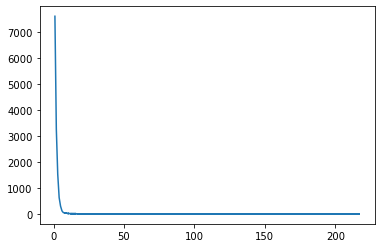

In [39]:
alert_BTC.groupby('user_id', sort = True)['date'].count().value_counts().plot()

In [40]:
alert_BTC_1 = alert_BTC.groupby(['date'])['market_y', 'high', 'low', 'open', 'close', 'volume'].mean()
alert_BTC_1.head()

<ipython-input-40-114a472db846>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  alert_BTC_1 = alert_BTC.groupby(['date'])['market_y', 'high', 'low', 'open', 'close', 'volume'].mean()


,market_y,high,low,open,close,volume
date,,,,,,
2017-01-17,1.462578e+10,910.56,830.80,830.95,907.94,155095008.0
2017-01-18,1.428404e+10,917.50,858.30,909.37,886.62,225676992.0
2017-01-19,1.448662e+10,904.61,884.34,888.34,899.07,105625000.0
2017-01-20,1.442355e+10,899.40,887.01,898.17,895.03,86728400.0
2017-01-21,1.485691e+10,927.37,895.53,895.55,921.79,111158000.0


# Feature Engineering

In [41]:
#Feature engineering to generate percentage change
alert_BTC_1['high_daily_%_change'] = alert_BTC_1['high'].pct_change()
alert_BTC_1['low_daily_%_change'] = alert_BTC_1['low'].pct_change()
alert_BTC_1['open_daily_%_change'] = alert_BTC_1['open'].pct_change()
alert_BTC_1['close_daily_%_change'] = alert_BTC_1['close'].pct_change()
alert_BTC_1['volume_daily_%_change'] = alert_BTC_1['volume'].pct_change()
alert_BTC_1['market_daily_%_change'] = alert_BTC_1['market_y'].pct_change()

In [42]:
alert_BTC_1.head()

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,volume_daily_%_change,market_daily_%_change
date,,,,,,,,,,,,
2017-01-17,1.462578e+10,910.56,830.80,830.95,907.94,155095008.0,NaN,NaN,NaN,NaN,NaN,NaN
2017-01-18,1.428404e+10,917.50,858.30,909.37,886.62,225676992.0,0.007622,0.033101,0.094374,-0.023482,0.455089,-0.023366
2017-01-19,1.448662e+10,904.61,884.34,888.34,899.07,105625000.0,-0.014049,0.030339,-0.023126,0.014042,-0.531964,0.014182
2017-01-20,1.442355e+10,899.40,887.01,898.17,895.03,86728400.0,-0.005759,0.003019,0.011066,-0.004494,-0.178903,-0.004354
2017-01-21,1.485691e+10,927.37,895.53,895.55,921.79,111158000.0,0.031099,0.009605,-0.002917,0.029898,0.281679,0.030046


## Plotting the new percent change features

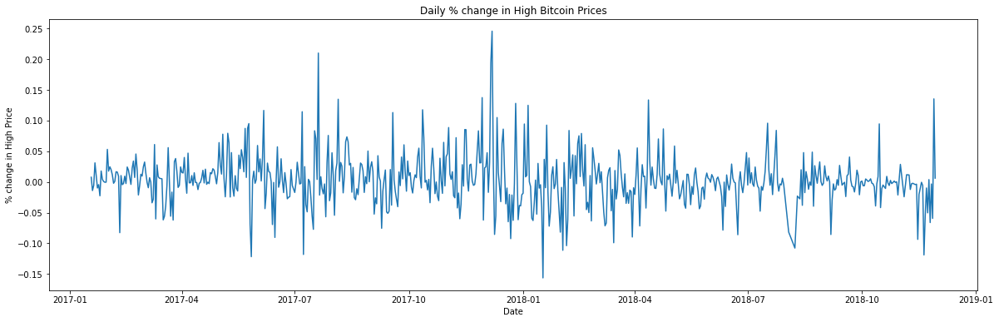

In [43]:
ax = alert_BTC_1['high_daily_%_change'].plot(title='Daily % change in High Bitcoin Prices', 
                                  figsize = (20,6))
ax.set_xlabel('Date')
ax.set_ylabel('% change in High Price');


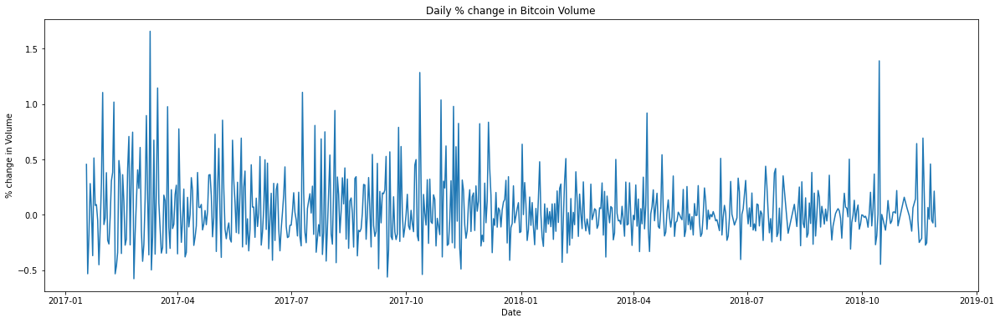

In [44]:
ax = alert_BTC_1['volume_daily_%_change'].plot(title='Daily % change in Bitcoin Volume', 
                                  figsize = (20,6))
ax.set_xlabel('Date')
ax.set_ylabel('% change in Volume');

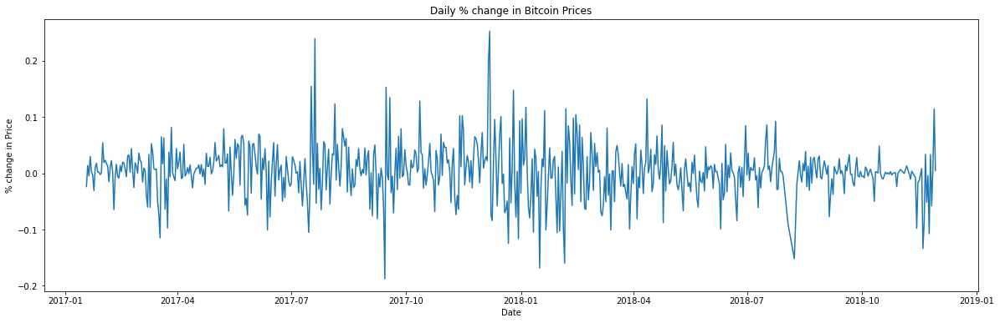

In [45]:
ax = alert_BTC_1['close_daily_%_change'].plot(title='Daily % change in Bitcoin Prices', 
                                  figsize = (20,6))
ax.set_xlabel('Date')
ax.set_ylabel('% change in Price');

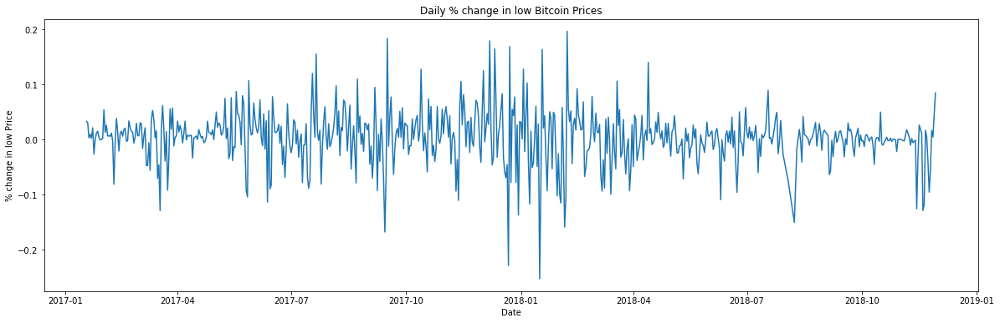

In [46]:
ax = alert_BTC_1['low_daily_%_change'].plot(title='Daily % change in low Bitcoin Prices', 
                                  figsize = (20,6))
ax.set_xlabel('Date')
ax.set_ylabel('% change in low Price');

In [47]:
import matplotlib as mp

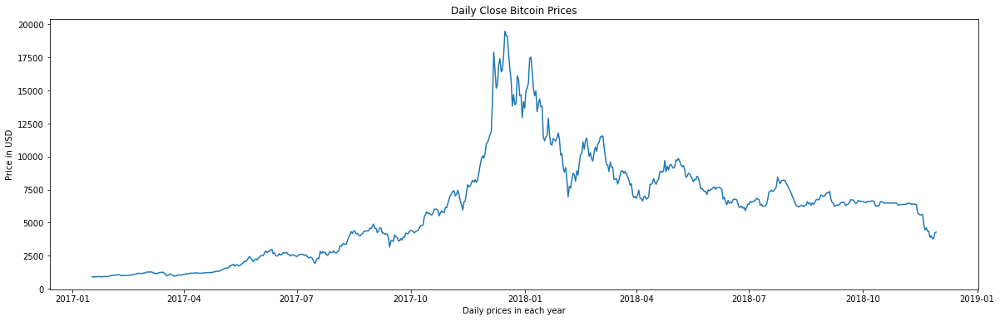

In [48]:
ax = alert_BTC_1['close'].plot(title='Daily Close Bitcoin Prices', 
                                  figsize = (20,6))
ax.set_xlabel('Daily prices in each year')
ax.set_ylabel('Price in USD');
#ax.set_xticks(np.arange(2013,2018))
ax.xaxis.set_minor_formatter(mp.dates.DateFormatter('%m'))

In [49]:
alert_BTC_1.isnull().sum()

market_y                 0
high                     0
low                      0
open                     0
close                    0
volume                   0
high_daily_%_change      1
low_daily_%_change       1
open_daily_%_change      1
close_daily_%_change     1
volume_daily_%_change    1
market_daily_%_change    1
dtype: int64

In [50]:
alert_BTC_1_clean = alert_BTC_1.fillna(0)

## Pandas profiling function is used for a quick overview of the variables

In [51]:
!pip install pandas-profiling==2.8.0
import pandas_profiling as pp

In [52]:
alert_BTC_1_clean.profile_report()

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [53]:
# Import the notification data
df_notification = pd.read_csv('alerts_notifications_sent.csv')
df_notification.head()

,id,alert_id,user_id,user_channels,message,message_type,created_at,updated_at
0,1,4,2,1,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 07:55:05,NaN
1,2,4,2,2,Coindera Alert: GDAX - BTC_USD. The buy price...,NaN,2017-01-17 07:55:05,NaN
2,3,4,2,3,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 07:55:05,NaN
3,4,4,2,1,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 08:00:09,NaN
4,5,4,2,3,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 08:00:10,NaN


# Removing the outliers

In [54]:

i = df_notification[(df_notification.alert_id == 85470)].index
df_notification = df_notification.drop(i)
df_notification["alert_id"].describe()

count    3.582507e+06
mean     6.762906e+04
std      4.536166e+04
min      1.000000e+00
25%      3.324100e+04
50%      6.085500e+04
75%      9.116700e+04
max      1.765100e+05
Name: alert_id, dtype: float64

In [55]:
df_notification.shape

(3582507, 8)

In [56]:
df_notification.isnull().sum()

id                     0
alert_id               0
user_id                0
user_channels          0
message                0
message_type     3582507
created_at             0
updated_at       3582507
dtype: int64

## Quick wrangling of the data

In [57]:
# Splitting the variable 'message'
d3 = df_notification['message'].str.split('- ', n = 1, expand = True)
df1_noti = pd.DataFrame(d3)
df1_noti.columns = ["symbol", "currency_2"]

In [58]:
# Splitting the variable 'currency_2'
d4 = d3['currency_2'].str.split('_', n = 1, expand = True)
df1_noti_4 = pd.DataFrame(d4)
df1_noti_4.columns = ["symbol2", "currency_2"]

In [59]:
df1_noti_4.head()

,symbol2,currency_2
0,BTC,USD alert has been triggered. Alert me when th...
1,BTC,USD. The buy price is less than 1000. The buy...
2,BTC,USD alert has been triggered. Alert me when th...
3,BTC,USD alert has been triggered. Alert me when th...
4,BTC,USD alert has been triggered. Alert me when th...


In [60]:
df_notification_1 = pd.concat([df_notification, df1_noti_4], axis = 1)
df_notification_1.head()

,id,alert_id,user_id,user_channels,message,message_type,created_at,updated_at,symbol2,currency_2
0,1,4,2,1,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 07:55:05,NaN,BTC,USD alert has been triggered. Alert me when th...
1,2,4,2,2,Coindera Alert: GDAX - BTC_USD. The buy price...,NaN,2017-01-17 07:55:05,NaN,BTC,USD. The buy price is less than 1000. The buy...
2,3,4,2,3,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 07:55:05,NaN,BTC,USD alert has been triggered. Alert me when th...
3,4,4,2,1,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 08:00:09,NaN,BTC,USD alert has been triggered. Alert me when th...
4,5,4,2,3,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 08:00:10,NaN,BTC,USD alert has been triggered. Alert me when th...


# Dropping some low signal columns

In [61]:
a = df_notification_1.drop(df_notification_1.columns[[4, 5, 7, 9, ]], axis = 1)

In [62]:
df_notification_BTC = df_notification_1[df_notification_1['symbol2'] == 'BTC']

In [63]:
df_notification_BTC.head()

,id,alert_id,user_id,user_channels,message,message_type,created_at,updated_at,symbol2,currency_2
0,1,4,2,1,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 07:55:05,NaN,BTC,USD alert has been triggered. Alert me when th...
1,2,4,2,2,Coindera Alert: GDAX - BTC_USD. The buy price...,NaN,2017-01-17 07:55:05,NaN,BTC,USD. The buy price is less than 1000. The buy...
2,3,4,2,3,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 07:55:05,NaN,BTC,USD alert has been triggered. Alert me when th...
3,4,4,2,1,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 08:00:09,NaN,BTC,USD alert has been triggered. Alert me when th...
4,5,4,2,3,Your GDAX - BTC_USD alert has been triggered. ...,NaN,2017-01-17 08:00:10,NaN,BTC,USD alert has been triggered. Alert me when th...


In [64]:
df_notification_BTC = df_notification_1.drop(df_notification_1.columns[[4, 5, 7, ]], axis = 1)

In [65]:
df_notification_BTC.head()

,id,alert_id,user_id,user_channels,created_at,symbol2,currency_2
0,1,4,2,1,2017-01-17 07:55:05,BTC,USD alert has been triggered. Alert me when th...
1,2,4,2,2,2017-01-17 07:55:05,BTC,USD. The buy price is less than 1000. The buy...
2,3,4,2,3,2017-01-17 07:55:05,BTC,USD alert has been triggered. Alert me when th...
3,4,4,2,1,2017-01-17 08:00:09,BTC,USD alert has been triggered. Alert me when th...
4,5,4,2,3,2017-01-17 08:00:10,BTC,USD alert has been triggered. Alert me when th...


In [66]:
df_notification_BTC['date'] = pd.to_datetime(df_notification_BTC['created_at']).dt.date
df_notification_BTC['time'] = pd.to_datetime(df_notification_BTC['created_at']).dt.time
df_notification_BTC.head()

,id,alert_id,user_id,user_channels,created_at,symbol2,currency_2,date,time
0,1,4,2,1,2017-01-17 07:55:05,BTC,USD alert has been triggered. Alert me when th...,2017-01-17,07:55:05
1,2,4,2,2,2017-01-17 07:55:05,BTC,USD. The buy price is less than 1000. The buy...,2017-01-17,07:55:05
2,3,4,2,3,2017-01-17 07:55:05,BTC,USD alert has been triggered. Alert me when th...,2017-01-17,07:55:05
3,4,4,2,1,2017-01-17 08:00:09,BTC,USD alert has been triggered. Alert me when th...,2017-01-17,08:00:09
4,5,4,2,3,2017-01-17 08:00:10,BTC,USD alert has been triggered. Alert me when th...,2017-01-17,08:00:10


In [67]:
df_notification_BTC.dtypes

id                int64
alert_id          int64
user_id           int64
user_channels     int64
created_at       object
symbol2          object
currency_2       object
date             object
time             object
dtype: object

# Getting the counts of the user_id and alert_id by dates

In [68]:
test = df_notification_BTC.groupby('date')['user_id', 'alert_id'].count()

<ipython-input-68-5b3a07ee8bf2>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  test = df_notification_BTC.groupby('date')['user_id', 'alert_id'].count()


In [69]:
test = pd.DataFrame(test)
test

,user_id,alert_id
date,,
2017-01-17,30,30
2017-01-18,53,53
2017-01-19,165,165
2017-01-20,85,85
2017-01-21,112,112
...,...,...
2020-07-27,2382,2382
2020-07-28,1290,1290
2020-07-29,1453,1453


In [70]:
i = test[(test.alert_id == 85470)].index
test = test.drop(i)
test["alert_id"].describe()

count     1291.000000
mean      2708.781565
std       2832.080885
min          3.000000
25%       1273.500000
50%       1496.000000
75%       2985.000000
max      21306.000000
Name: alert_id, dtype: float64

## Merging the alert_BTC_1 dataframe with the user_id and alert_id counts

In [71]:
# merge alert_BTC_1, test
notification_market_BTC = alert_BTC_1.merge(test, left_index=True, right_on='date')


In [72]:
notification_market_BTC.head()

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,volume_daily_%_change,market_daily_%_change,user_id,alert_id
date,,,,,,,,,,,,,,
2017-01-17,1.462578e+10,910.56,830.80,830.95,907.94,155095008.0,NaN,NaN,NaN,NaN,NaN,NaN,30,30
2017-01-18,1.428404e+10,917.50,858.30,909.37,886.62,225676992.0,0.007622,0.033101,0.094374,-0.023482,0.455089,-0.023366,53,53
2017-01-19,1.448662e+10,904.61,884.34,888.34,899.07,105625000.0,-0.014049,0.030339,-0.023126,0.014042,-0.531964,0.014182,165,165
2017-01-20,1.442355e+10,899.40,887.01,898.17,895.03,86728400.0,-0.005759,0.003019,0.011066,-0.004494,-0.178903,-0.004354,85,85
2017-01-21,1.485691e+10,927.37,895.53,895.55,921.79,111158000.0,0.031099,0.009605,-0.002917,0.029898,0.281679,0.030046,112,112


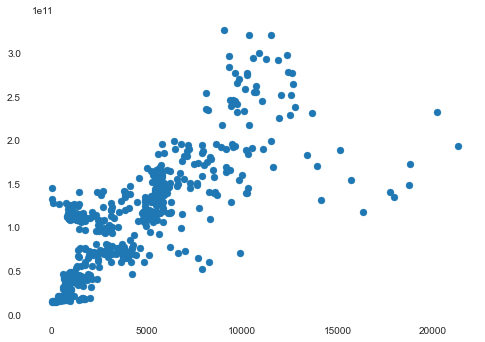

In [73]:
plt.scatter(notification_market_BTC['alert_id'], notification_market_BTC['market_y'])

In [74]:
notification_market_BTC.isnull().sum()

market_y                 0
high                     0
low                      0
open                     0
close                    0
volume                   0
high_daily_%_change      1
low_daily_%_change       1
open_daily_%_change      1
close_daily_%_change     1
volume_daily_%_change    1
market_daily_%_change    1
user_id                  0
alert_id                 0
dtype: int64

In [75]:
notification_market_BTC = notification_market_BTC.fillna(0)

In [76]:
i = notification_market_BTC[(notification_market_BTC.alert_id == 85470)].index
notification_market_BTC = notification_market_BTC.drop(i)
notification_market_BTC["alert_id"].describe()

count      660.000000
mean      3829.266667
std       3587.269620
min         30.000000
25%        984.250000
50%       2568.000000
75%       5580.000000
max      21306.000000
Name: alert_id, dtype: float64

In [77]:
# gets percent change of alert_id's counts
notification_market_BTC['alert__daily_count_%_change'] = notification_market_BTC['alert_id'].pct_change()

In [78]:
notification_market_BTC = notification_market_BTC.fillna(0)

In [79]:
notification_market_BTC.head().T

date,2017-01-17,2017-01-18,2017-01-19,2017-01-20,2017-01-21
market_y,1.462578e+10,1.428404e+10,1.448662e+10,1.442355e+10,1.485691e+10
high,9.105600e+02,9.175000e+02,9.046100e+02,8.994000e+02,9.273700e+02
low,8.308000e+02,8.583000e+02,8.843400e+02,8.870100e+02,8.955300e+02
open,8.309500e+02,9.093700e+02,8.883400e+02,8.981700e+02,8.955500e+02
close,9.079400e+02,8.866200e+02,8.990700e+02,8.950300e+02,9.217900e+02
volume,1.550950e+08,2.256770e+08,1.056250e+08,8.672840e+07,1.111580e+08
high_daily_%_change,0.000000e+00,7.621683e-03,-1.404905e-02,-5.759388e-03,3.109851e-02
low_daily_%_change,0.000000e+00,3.310063e-02,3.033904e-02,3.019201e-03,9.605303e-03
open_daily_%_change,0.000000e+00,9.437391e-02,-2.312590e-02,1.106558e-02,-2.917042e-03
close_daily_%_change,0.000000e+00,-2.348173e-02,1.404209e-02,-4.493532e-03,2.989844e-02


# Dropping the outliers

In [80]:
i = notification_market_BTC[(notification_market_BTC["alert__daily_count_%_change"] == 353.860000)].index
notification_market_BTC = notification_market_BTC.drop(i)
notification_market_BTC["alert__daily_count_%_change"].describe()



count    659.000000
mean       0.051003
std        0.385916
min       -0.852111
25%       -0.104615
50%       -0.001634
75%        0.143918
max        4.744249
Name: alert__daily_count_%_change, dtype: float64

In [81]:
i = notification_market_BTC[(notification_market_BTC["alert__daily_count_%_change"] >= 4)].index
notification_market_BTC = notification_market_BTC.drop(i)
notification_market_BTC["alert__daily_count_%_change"].describe()

count    658.000000
mean       0.043870
std        0.339972
min       -0.852111
25%       -0.105056
50%       -0.001719
75%        0.143434
max        2.266601
Name: alert__daily_count_%_change, dtype: float64

In [82]:
# plt.scatter(notification_market_BTC['alert__daily_count_%_change'], notification_market_BTC['market_daily_%_change'])

In [83]:
notification_market_BTC['alert__daily_count_%_change'].describe()


count    658.000000
mean       0.043870
std        0.339972
min       -0.852111
25%       -0.105056
50%       -0.001719
75%        0.143434
max        2.266601
Name: alert__daily_count_%_change, dtype: float64

# Extracting a new feature "change". Here, if the percent change is positive, it returns 1 otherwise it returns 0

In [84]:
notification_market_BTC['change'] = np.where(notification_market_BTC['close_daily_%_change']>0, 1, 0)

In [85]:
notification_market_BTC.head()

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,volume_daily_%_change,market_daily_%_change,user_id,alert_id,alert__daily_count_%_change,change
date,,,,,,,,,,,,,,,,
2017-01-17,1.462578e+10,910.56,830.80,830.95,907.94,155095008.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,30,30,0.000000,0
2017-01-18,1.428404e+10,917.50,858.30,909.37,886.62,225676992.0,0.007622,0.033101,0.094374,-0.023482,0.455089,-0.023366,53,53,0.766667,0
2017-01-19,1.448662e+10,904.61,884.34,888.34,899.07,105625000.0,-0.014049,0.030339,-0.023126,0.014042,-0.531964,0.014182,165,165,2.113208,1
2017-01-20,1.442355e+10,899.40,887.01,898.17,895.03,86728400.0,-0.005759,0.003019,0.011066,-0.004494,-0.178903,-0.004354,85,85,-0.484848,0
2017-01-21,1.485691e+10,927.37,895.53,895.55,921.79,111158000.0,0.031099,0.009605,-0.002917,0.029898,0.281679,0.030046,112,112,0.317647,1


In [86]:
# notification_market_BTC.columns

In [87]:
notification_market_BTC_4 = notification_market_BTC.reset_index()

In [88]:
notification_market_BTC_4['date'] = pd.to_datetime(notification_market_BTC_4['date'])

# Creating  row below so as to be able to predict future price (i.e predict tomorrow's price based on today's price) with the new variable close_shift_daily_%_change

In [89]:
notification_market_BTC_4['close_daily_%_change'].index = notification_market_BTC_4['close_daily_%_change'].index+1

In [90]:
# Concantenating the new feature to the data
k_df = pd.concat([notification_market_BTC_4, notification_market_BTC_4['close_daily_%_change']], axis = 1)

In [91]:
# notification_market_BTC_5 = notification_market_BTC_4.drop(notification_market_BTC_4.columns[[10]], axis = 1)

In [92]:
#renaming the last column appropriately with close_shift_daily_%_change
k_df.columns = ['date', 'market_y', 'high', 'low', 'open', 'close', 'volume',
       'high_daily_%_change', 'low_daily_%_change', 'open_daily_%_change',
       'close_daily_%_change', 'volume_daily_%_change',
       'market_daily_%_change', 'user_id', 'alert_id',
       'alert__daily_count_%_change', 'change',
       'close_shift_daily_%_change']

***k_df is the new dataframe to be used for the regression model.***

In [93]:
#Shape of the new df
k_df.shape

(659, 18)

In [94]:
#Replacing the missing data with 0
k_df = k_df.fillna(0)

In [95]:
# y_k = k['close_shift_daily_%_change']
# y1_k = k['close_shift_daily_%_change'].values

# Preprocessing

In [96]:
# Response variable
y_k = k_df['close_shift_daily_%_change']
# y1_k = k['close_shift_daily_%_change'].values

# Explanatory variables
x_k = k_df[['high_daily_%_change', 'low_daily_%_change', 'open_daily_%_change', 'volume_daily_%_change',
       'market_daily_%_change', 'alert__daily_count_%_change', 'alert_id']]

## TRADING STRATEGY 0: Linear Regression Model


### MODELLING

#### The Ordinary least square model

***The ordinary least squares (OLS) method is being fitted below to estimate the response variable close_shift_daily_%_change.***

# Baseline Model using only the market features

***The model below shows a regression model with the features 'high_daily_%_change', 'volume_daily_%_change', 'low_daily_%_change', and 'alert__daily_count_%_change'***

In [97]:
result_k = ols("y_k ~ x_k['high_daily_%_change'] + x_k['volume_daily_%_change'] + x_k['low_daily_%_change']  + x_k['alert__daily_count_%_change']", data=x_k).fit()
display( result_k.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    y_k   R-squared:                       0.365
Model:                            OLS   Adj. R-squared:                  0.361
Method:                 Least Squares   F-statistic:                     93.90
Date:                Thu, 07 Oct 2021   Prob (F-statistic):           4.30e-63
Time:                        01:41:14   Log-Likelihood:                 1228.1
No. Observations:                 659   AIC:                            -2446.
Df Residuals:                     654   BIC:                            -2424.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                              0.0013      0.002      0.874      0.382      -0.002       0.004
x_k['high_daily_%_change']             0.4574      0.054      8.432      0.000       0.351       0.564
x_k['volume_daily_%_change']          -0.0175      0.007     -2.579      0.010      -0.031      -0.004
x_k['low_daily_%_change']              0.2844      0.046      6.239      0.000       0.195       0.374
x_k['alert__daily_count_%_change']     0.0107      0.005      2.200      0.028       0.001       0.020
==============================================================================
Omnibus:                       90.616   Durbin-Watson:                   2.821
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              638.101
Skew:                           0.356   Prob(JB):                    2.74e-139
Kurtosis:                       7.768   Cond. No.                         45.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Baseline Model including the Alerts Feature

***The model below shows a regression model with the features 'high_daily_%_change', 'volume_daily_%_change', 'low_daily_%_change'***

In [98]:
result_k2 = ols("y_k ~ x_k['high_daily_%_change'] + x_k['volume_daily_%_change'] + x_k['low_daily_%_change']", data=x_k).fit()
display( result_k2.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    y_k   R-squared:                       0.360
Model:                            OLS   Adj. R-squared:                  0.357
Method:                 Least Squares   F-statistic:                     122.9
Date:                Thu, 07 Oct 2021   Prob (F-statistic):           3.91e-63
Time:                        01:41:14   Log-Likelihood:                 1225.7
No. Observations:                 659   AIC:                            -2443.
Df Residuals:                     655   BIC:                            -2425.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept                        0.0016      0.002      1.090      0.276      -0.001       0.005
x_k['high_daily_%_change']       0.4728      0.054      8.764      0.000       0.367       0.579
x_k['volume_daily_%_change']    -0.0136      0.007     -2.076      0.038      -0.027      -0.001
x_k['low_daily_%_change']        0.2660      0.045      5.919      0.000       0.178       0.354
==============================================================================
Omnibus:                       87.319   Durbin-Watson:                   2.819
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              604.565
Skew:                           0.331   Prob(JB):                    5.25e-132
Kurtosis:                       7.645   Cond. No.                         44.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

***The model with only crypto market features has a R-Squared of 0.360. However, when the alert feature was added to the model, there was a slight increase in R-Squared to 0.365. This is an indication that the alert has a slight impact on the model performance. Although both models performed poorly***

## TRADING STRATEGY #1 Bollinger Band.


In [99]:
k_df = k_df.set_index('date')
k_df.head()


,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,volume_daily_%_change,market_daily_%_change,user_id,alert_id,alert__daily_count_%_change,change,close_shift_daily_%_change
date,,,,,,,,,,,,,,,,,
2017-01-17 00:00:00,1.462578e+10,910.56,830.80,830.95,907.94,155095008.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,30.0,30.0,0.000000,0.0,0.000000
2017-01-18 00:00:00,1.428404e+10,917.50,858.30,909.37,886.62,225676992.0,0.007622,0.033101,0.094374,-0.023482,0.455089,-0.023366,53.0,53.0,0.766667,0.0,0.000000
2017-01-19 00:00:00,1.448662e+10,904.61,884.34,888.34,899.07,105625000.0,-0.014049,0.030339,-0.023126,0.014042,-0.531964,0.014182,165.0,165.0,2.113208,1.0,-0.023482
2017-01-20 00:00:00,1.442355e+10,899.40,887.01,898.17,895.03,86728400.0,-0.005759,0.003019,0.011066,-0.004494,-0.178903,-0.004354,85.0,85.0,-0.484848,0.0,0.014042
2017-01-21 00:00:00,1.485691e+10,927.37,895.53,895.55,921.79,111158000.0,0.031099,0.009605,-0.002917,0.029898,0.281679,0.030046,112.0,112.0,0.317647,1.0,-0.004494


In [100]:
k_df = k_df.fillna(0)
k_df.head(2)

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,volume_daily_%_change,market_daily_%_change,user_id,alert_id,alert__daily_count_%_change,change,close_shift_daily_%_change
date,,,,,,,,,,,,,,,,,
2017-01-17 00:00:00,1.462578e+10,910.56,830.8,830.95,907.94,155095008.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,30.0,30.0,0.000000,0.0,0.0
2017-01-18 00:00:00,1.428404e+10,917.50,858.3,909.37,886.62,225676992.0,0.007622,0.033101,0.094374,-0.023482,0.455089,-0.023366,53.0,53.0,0.766667,0.0,0.0


# The 20-day simple moving average

In [101]:
notification_market_BTC['20_day_sma_close'] = notification_market_BTC['close'].rolling(window=20).mean()
notification_market_BTC.head()

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,volume_daily_%_change,market_daily_%_change,user_id,alert_id,alert__daily_count_%_change,change,20_day_sma_close
date,,,,,,,,,,,,,,,,,
2017-01-17,1.462578e+10,910.56,830.80,830.95,907.94,155095008.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,30,30,0.000000,0,NaN
2017-01-18,1.428404e+10,917.50,858.30,909.37,886.62,225676992.0,0.007622,0.033101,0.094374,-0.023482,0.455089,-0.023366,53,53,0.766667,0,NaN
2017-01-19,1.448662e+10,904.61,884.34,888.34,899.07,105625000.0,-0.014049,0.030339,-0.023126,0.014042,-0.531964,0.014182,165,165,2.113208,1,NaN
2017-01-20,1.442355e+10,899.40,887.01,898.17,895.03,86728400.0,-0.005759,0.003019,0.011066,-0.004494,-0.178903,-0.004354,85,85,-0.484848,0,NaN
2017-01-21,1.485691e+10,927.37,895.53,895.55,921.79,111158000.0,0.031099,0.009605,-0.002917,0.029898,0.281679,0.030046,112,112,0.317647,1,NaN


In [102]:
k_df = k_df.dropna()

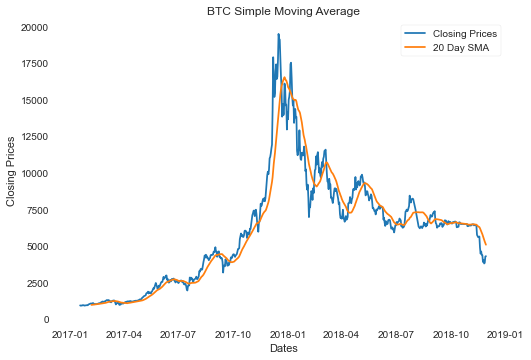

In [103]:
# Plot the simple moving average for 20 day
plt.title('BTC Simple Moving Average')
plt.xlabel('Dates')
plt.ylabel('Closing Prices')
plt.plot(notification_market_BTC['close'], label='Closing Prices')
plt.plot(notification_market_BTC['20_day_sma_close'], label='20 Day SMA')
plt.legend()
plt.show()

# Generating features for the upper bands and lower bands

# One standard deviation away from the 20 day moving average to get Upper Band_1 and Lower Band_1

In [104]:
notification_market_BTC['Upper Band_1'] = notification_market_BTC['20_day_sma_close'] + (1 * notification_market_BTC['close'].rolling(window=20).std())
notification_market_BTC['Lower Band_1'] = notification_market_BTC['20_day_sma_close'] - (1 * notification_market_BTC['close'].rolling(window=20).std())
notification_market_BTC.head()

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,volume_daily_%_change,market_daily_%_change,user_id,alert_id,alert__daily_count_%_change,change,20_day_sma_close,Upper Band_1,Lower Band_1
date,,,,,,,,,,,,,,,,,,,
2017-01-17,1.462578e+10,910.56,830.80,830.95,907.94,155095008.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,30,30,0.000000,0,NaN,NaN,NaN
2017-01-18,1.428404e+10,917.50,858.30,909.37,886.62,225676992.0,0.007622,0.033101,0.094374,-0.023482,0.455089,-0.023366,53,53,0.766667,0,NaN,NaN,NaN
2017-01-19,1.448662e+10,904.61,884.34,888.34,899.07,105625000.0,-0.014049,0.030339,-0.023126,0.014042,-0.531964,0.014182,165,165,2.113208,1,NaN,NaN,NaN
2017-01-20,1.442355e+10,899.40,887.01,898.17,895.03,86728400.0,-0.005759,0.003019,0.011066,-0.004494,-0.178903,-0.004354,85,85,-0.484848,0,NaN,NaN,NaN
2017-01-21,1.485691e+10,927.37,895.53,895.55,921.79,111158000.0,0.031099,0.009605,-0.002917,0.029898,0.281679,0.030046,112,112,0.317647,1,NaN,NaN,NaN


# Two standard deviation away from the 20 day moving average to get Upper Band_2 and Lower Band_2

In [105]:
notification_market_BTC['Upper Band_2'] = notification_market_BTC['20_day_sma_close'] + (2 * notification_market_BTC['close'].rolling(window=20).std())
notification_market_BTC['Lower Band_2'] = notification_market_BTC['20_day_sma_close'] - (2 * notification_market_BTC['close'].rolling(window=20).std())
notification_market_BTC.head()

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,...,market_daily_%_change,user_id,alert_id,alert__daily_count_%_change,change,20_day_sma_close,Upper Band_1,Lower Band_1,Upper Band_2,Lower Band_2
date,,,,,,,,,,,,,,,,,,,,,
2017-01-17,1.462578e+10,910.56,830.80,830.95,907.94,155095008.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,30,30,0.000000,0,NaN,NaN,NaN,NaN,NaN
2017-01-18,1.428404e+10,917.50,858.30,909.37,886.62,225676992.0,0.007622,0.033101,0.094374,-0.023482,...,-0.023366,53,53,0.766667,0,NaN,NaN,NaN,NaN,NaN
2017-01-19,1.448662e+10,904.61,884.34,888.34,899.07,105625000.0,-0.014049,0.030339,-0.023126,0.014042,...,0.014182,165,165,2.113208,1,NaN,NaN,NaN,NaN,NaN
2017-01-20,1.442355e+10,899.40,887.01,898.17,895.03,86728400.0,-0.005759,0.003019,0.011066,-0.004494,...,-0.004354,85,85,-0.484848,0,NaN,NaN,NaN,NaN,NaN
2017-01-21,1.485691e+10,927.37,895.53,895.55,921.79,111158000.0,0.031099,0.009605,-0.002917,0.029898,...,0.030046,112,112,0.317647,1,NaN,NaN,NaN,NaN,NaN


# Three standard deviation away from the 20 day moving average to get Upper Band_3 and Lower Band_3

In [106]:
notification_market_BTC['Upper Band_3'] = notification_market_BTC['20_day_sma_close'] + (3 * notification_market_BTC['close'].rolling(window=20).std())
notification_market_BTC['Lower Band_3'] = notification_market_BTC['20_day_sma_close'] - (3 * notification_market_BTC['close'].rolling(window=20).std())
notification_market_BTC.head()

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,...,alert_id,alert__daily_count_%_change,change,20_day_sma_close,Upper Band_1,Lower Band_1,Upper Band_2,Lower Band_2,Upper Band_3,Lower Band_3
date,,,,,,,,,,,,,,,,,,,,,
2017-01-17,1.462578e+10,910.56,830.80,830.95,907.94,155095008.0,0.000000,0.000000,0.000000,0.000000,...,30,0.000000,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-01-18,1.428404e+10,917.50,858.30,909.37,886.62,225676992.0,0.007622,0.033101,0.094374,-0.023482,...,53,0.766667,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-01-19,1.448662e+10,904.61,884.34,888.34,899.07,105625000.0,-0.014049,0.030339,-0.023126,0.014042,...,165,2.113208,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-01-20,1.442355e+10,899.40,887.01,898.17,895.03,86728400.0,-0.005759,0.003019,0.011066,-0.004494,...,85,-0.484848,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-01-21,1.485691e+10,927.37,895.53,895.55,921.79,111158000.0,0.031099,0.009605,-0.002917,0.029898,...,112,0.317647,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [107]:
notification_market_BTC = notification_market_BTC.fillna(0)

In [108]:
notification_market_BTC.head()

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,...,alert_id,alert__daily_count_%_change,change,20_day_sma_close,Upper Band_1,Lower Band_1,Upper Band_2,Lower Band_2,Upper Band_3,Lower Band_3
date,,,,,,,,,,,,,,,,,,,,,
2017-01-17,1.462578e+10,910.56,830.80,830.95,907.94,155095008.0,0.000000,0.000000,0.000000,0.000000,...,30,0.000000,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2017-01-18,1.428404e+10,917.50,858.30,909.37,886.62,225676992.0,0.007622,0.033101,0.094374,-0.023482,...,53,0.766667,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2017-01-19,1.448662e+10,904.61,884.34,888.34,899.07,105625000.0,-0.014049,0.030339,-0.023126,0.014042,...,165,2.113208,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2017-01-20,1.442355e+10,899.40,887.01,898.17,895.03,86728400.0,-0.005759,0.003019,0.011066,-0.004494,...,85,-0.484848,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2017-01-21,1.485691e+10,927.37,895.53,895.55,921.79,111158000.0,0.031099,0.009605,-0.002917,0.029898,...,112,0.317647,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Plotting all the bands together

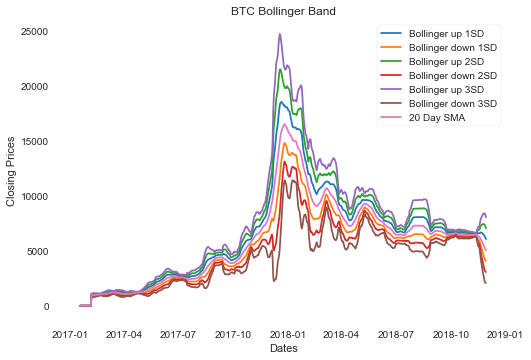

In [109]:
# Plot the data
plt.title('BTC Bollinger Band')
plt.xlabel('Dates')
plt.ylabel('Closing Prices')
plt.plot(notification_market_BTC['Upper Band_1'], label='Bollinger up 1SD')
plt.plot(notification_market_BTC['Lower Band_1'], label='Bollinger down 1SD')
plt.plot(notification_market_BTC['Upper Band_2'], label='Bollinger up 2SD')
plt.plot(notification_market_BTC['Lower Band_2'], label='Bollinger down 2SD')
plt.plot(notification_market_BTC['Upper Band_3'], label='Bollinger up 3SD')
plt.plot(notification_market_BTC['Lower Band_3'], label='Bollinger down 3SD')
plt.plot(notification_market_BTC['20_day_sma_close'], label='20 Day SMA')
plt.legend()
plt.show()

# Plotting the bands separately

# Ploting One standard deviation away from the 20 day moving average

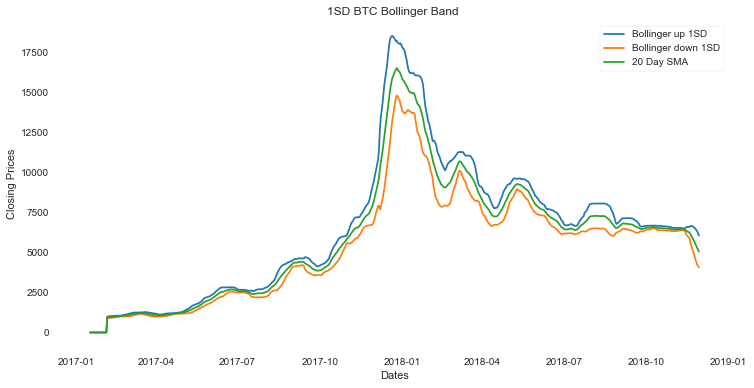

In [110]:
fig = plt.figure(figsize=(12,6))
plt.title('1SD BTC Bollinger Band ')
plt.xlabel('Dates')
plt.ylabel('Closing Prices')
plt.plot(notification_market_BTC['Upper Band_1'], label='Bollinger up 1SD')
plt.plot(notification_market_BTC['Lower Band_1'], label='Bollinger down 1SD')
plt.plot(notification_market_BTC['20_day_sma_close'], label='20 Day SMA')
plt.legend()
plt.show()

# Ploting two standard deviation away from the 20 day moving average

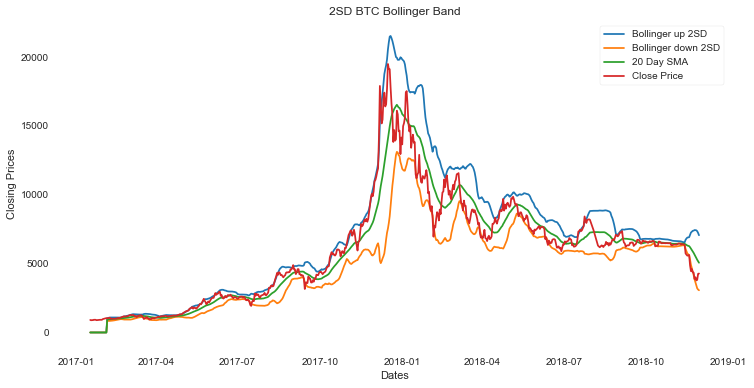

In [111]:
fig = plt.figure(figsize=(12,6))
plt.title('2SD BTC Bollinger Band')
plt.xlabel('Dates')
plt.ylabel('Closing Prices')
plt.plot(notification_market_BTC['Upper Band_2'], label='Bollinger up 2SD')
plt.plot(notification_market_BTC['Lower Band_2'], label='Bollinger down 2SD')
plt.plot(notification_market_BTC['20_day_sma_close'], label='20 Day SMA')
plt.plot(notification_market_BTC['close'], label='Close Price')

# ax.fill_between(x_axis, k['Upper Band'], k['Lower Band'], color='grey')
plt.legend()
plt.show()

# Making the 2 standard deviation look more nicer and cleaner

In [112]:
def implement_bb_strategy(data, lower_bb, upper_bb):
    buy_price = []
    sell_price = []
    bb_signal = []
    signal = 0
    
    for i in range(len(data)):
        if data[i-1] > lower_bb[i-1] and data[i] < lower_bb[i]:
            if signal != 1:
                buy_price.append(data[i])
                sell_price.append(np.nan)
                signal = 1
                bb_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                bb_signal.append(0)
        elif data[i-1] < upper_bb[i-1] and data[i] > upper_bb[i]:
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(data[i])
                signal = -1
                bb_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                bb_signal.append(0)
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            bb_signal.append(0)
            
    return buy_price, sell_price, bb_signal

buy_price, sell_price, bb_signal = implement_bb_strategy(notification_market_BTC['close'], notification_market_BTC['Lower Band_2'], notification_market_BTC['Upper Band_2'])

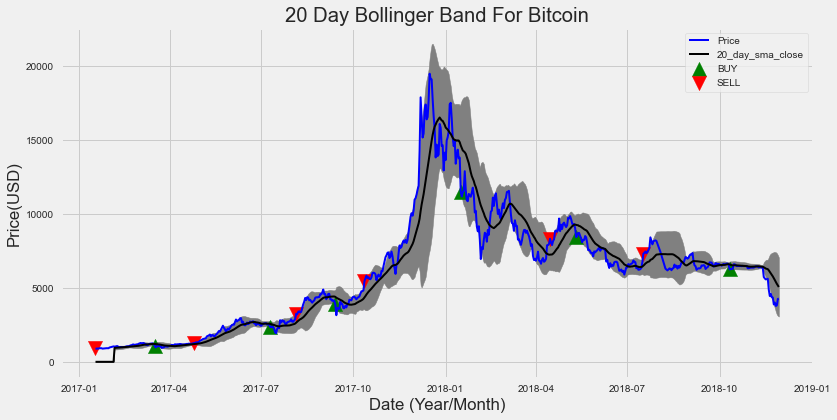

In [113]:
# set style, empty figure and axes
plt.style.use('fivethirtyeight')
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(111)

# Get index values for the X axis 
x_axis = notification_market_BTC.index.get_level_values(0)

# Plot shaded 21 Day Bollinger Band 
ax.fill_between(x_axis, notification_market_BTC['Upper Band_2'], notification_market_BTC['Lower Band_2'], color='grey')

# Plot Adjust Closing Price and Moving Averages
ax.plot(x_axis, notification_market_BTC['close'], color='blue', label = 'Price', lw=2)
ax.plot(x_axis, notification_market_BTC['20_day_sma_close'], color='black', label = '20_day_sma_close', lw=2)

plt.scatter(notification_market_BTC.index, buy_price, marker = '^', color = 'green', label = 'BUY', s = 200)

plt.scatter(notification_market_BTC.index, sell_price, marker = 'v', color = 'red', label = 'SELL', s = 200)
# Set Title & Show the Image
ax.set_title('20 Day Bollinger Band For Bitcoin')
ax.set_xlabel('Date (Year/Month)')
ax.set_ylabel('Price(USD)')
ax.legend()
plt.show();

***The chart above shows a better picture of the 20 day Bollinger band for bitcoin where there are indicators that show when to buy or sell stocks. The grey area shows the full squeeze effect of upper and lower bands while the blue and the black lines represent stock price and its 20 day simple moving average respectively.***


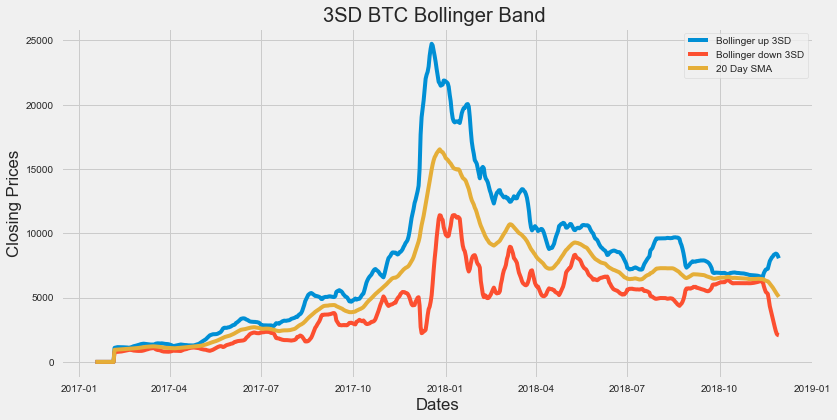

In [114]:
fig = plt.figure(figsize=(12,6))
plt.title('3SD BTC Bollinger Band ')
plt.xlabel('Dates')
plt.ylabel('Closing Prices')
plt.plot(notification_market_BTC['Upper Band_3'], label='Bollinger up 3SD')
plt.plot(notification_market_BTC['Lower Band_3'], label='Bollinger down 3SD')
plt.plot(notification_market_BTC['20_day_sma_close'], label='20 Day SMA')
plt.legend()
plt.show()

## TRADING STRATEGY #2: BITCOIN PRICE Z-SCORE


In [115]:
col_mean = notification_market_BTC["close"].rolling(window=20).mean()
col_std =  notification_market_BTC["close"].rolling(window=20).std()

notification_market_BTC["COL_ZSCORE"] = (notification_market_BTC["close"] - col_mean)/col_std

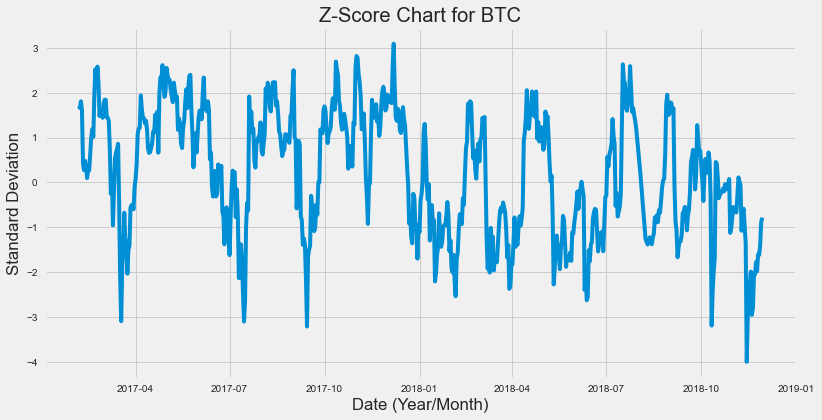

In [116]:
#Plotting the Z-score
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(111)
plt.xlabel('Date (Year/Month)')
plt.title('Z-Score Chart for BTC')
plt.xlabel('Date (Year/Month)')
plt.ylabel('Standard Deviation')
plt.plot(notification_market_BTC["COL_ZSCORE"])
plt.show();

***It is obvious that prices are mostly within 2 standard deviations of the average price. Some interesting points to note on the chart are the spikes that occurred around late 2017 which indicates an abnormal movement of the market. The points where the z-score move below zero indicates a great time to buy bitcoin. This is a metric that should be used in conjunction with other metrics to boost confidence in investment strategy.***

## TRADING STRATEGY #3: SIMPLE MOVING AVERAGE CROSSOVER (SMAC)


# A simple moving average crossover trading strategy that tells traders when to buy or sell.     

In [117]:
k_2 = notification_market_BTC_4.set_index('date')
k_2.head()

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,volume_daily_%_change,market_daily_%_change,user_id,alert_id,alert__daily_count_%_change,change
date,,,,,,,,,,,,,,,,
2017-01-17,1.462578e+10,910.56,830.80,830.95,907.94,155095008.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,30,30,0.000000,0
2017-01-18,1.428404e+10,917.50,858.30,909.37,886.62,225676992.0,0.007622,0.033101,0.094374,-0.023482,0.455089,-0.023366,53,53,0.766667,0
2017-01-19,1.448662e+10,904.61,884.34,888.34,899.07,105625000.0,-0.014049,0.030339,-0.023126,0.014042,-0.531964,0.014182,165,165,2.113208,1
2017-01-20,1.442355e+10,899.40,887.01,898.17,895.03,86728400.0,-0.005759,0.003019,0.011066,-0.004494,-0.178903,-0.004354,85,85,-0.484848,0
2017-01-21,1.485691e+10,927.37,895.53,895.55,921.79,111158000.0,0.031099,0.009605,-0.002917,0.029898,0.281679,0.030046,112,112,0.317647,1


In [118]:
#getting values of price
smac = k_2['close'].values

In [119]:
short_lb = 9 
long_lb = 21
signal_df = pd.DataFrame(index=k_2.index)
signal_df['signal'] = 0.0
signal_df['short_mav'] = k_2[['close']].rolling(window=short_lb,min_periods=1, center=False).mean()


In [120]:
k_2.head()

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,volume_daily_%_change,market_daily_%_change,user_id,alert_id,alert__daily_count_%_change,change
date,,,,,,,,,,,,,,,,
2017-01-17,1.462578e+10,910.56,830.80,830.95,907.94,155095008.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,30,30,0.000000,0
2017-01-18,1.428404e+10,917.50,858.30,909.37,886.62,225676992.0,0.007622,0.033101,0.094374,-0.023482,0.455089,-0.023366,53,53,0.766667,0
2017-01-19,1.448662e+10,904.61,884.34,888.34,899.07,105625000.0,-0.014049,0.030339,-0.023126,0.014042,-0.531964,0.014182,165,165,2.113208,1
2017-01-20,1.442355e+10,899.40,887.01,898.17,895.03,86728400.0,-0.005759,0.003019,0.011066,-0.004494,-0.178903,-0.004354,85,85,-0.484848,0
2017-01-21,1.485691e+10,927.37,895.53,895.55,921.79,111158000.0,0.031099,0.009605,-0.002917,0.029898,0.281679,0.030046,112,112,0.317647,1


In [121]:
signal_df['long_mav'] = k_2[['close']].rolling(window=long_lb, min_periods=1, center=False).mean()


In [122]:
signal_df['signal'][short_lb:] = np.where(signal_df['short_mav'][short_lb:] > signal_df['long_mav'][short_lb:], 1.0, 0.0)   


In [123]:
signal_df['positions'] = signal_df['signal'].diff()
signal_df[signal_df['positions'] == -1.0]


,signal,short_mav,long_mav,positions
date,,,,
2017-03-15,0.0,1199.721111,1207.165238,-1.0
2017-06-20,0.0,2597.968889,2638.530476,-1.0
2017-09-10,0.0,4394.368889,4398.430476,-1.0
2017-12-25,0.0,16104.733333,16227.723810,-1.0
2018-01-14,0.0,14918.000000,14927.009524,-1.0
2018-03-10,0.0,10445.114444,10481.063333,-1.0
2018-05-13,0.0,9128.913333,9224.312381,-1.0
2018-08-14,0.0,7037.328889,7233.216190,-1.0
2018-09-10,0.0,6726.672222,6779.426190,-1.0


## SMAC MODEL

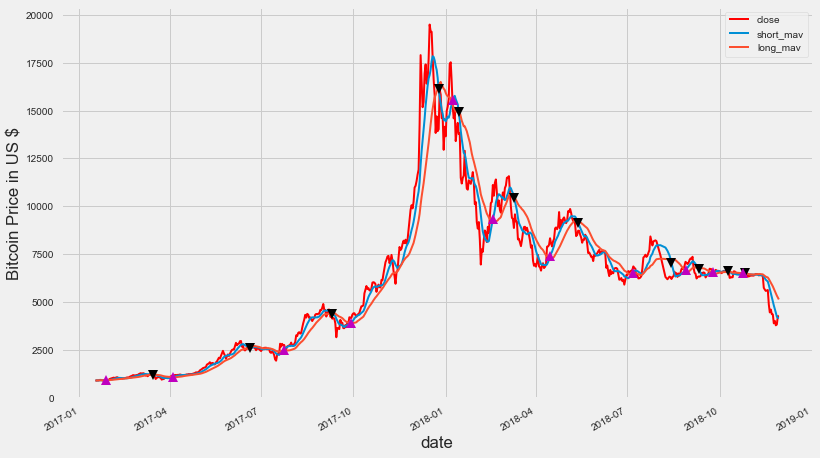

In [124]:
fig = plt.figure()
plt1 = fig.add_subplot(111,  ylabel='Bitcoin Price in US $')
k_2[['close']].plot(ax=plt1, color='r', lw=2.)

signal_df[['short_mav', 'long_mav']].plot(ax=plt1, lw=2., figsize=(12,8))
plt1.plot(signal_df.loc[signal_df.positions == -1.0].index,signal_df.short_mav[signal_df.positions == -1.0],'v',                     markersize=10, color='k')
plt1.plot(signal_df.loc[signal_df.positions == 1.0].index,signal_df.short_mav[signal_df.positions == 1.0],'^', markersize=10, color='m')         # Show the plotplt.show()


***This shows an SMAC graph with buy and sell indicators. The purple arrow shows that it is time for traders to buy bitcoin Which means that, at this point, the market is oversold. The black arrow is when the market is overbought, then traders can sell at this point.***

***We will now see what a trader will have in their portforlio after starting with a specific amount of dollars, by quantifying the trading performance. Below is an example of starting with a portfolio worth of 1000 dollars in 2017.***

## RESULTS: QUANTIFIED AUTOMATED TRADING PERFORMANCE


In [125]:
# initial trading capital
trad_capital= float(1000)

positions = pd.DataFrame(index=signal_df.index).fillna(0.0)

#Buy a 1000 USD in Bitcoins
positions['Position ($)'] = signal_df['signal']

portfolio = positions.multiply(k_2['close'], axis = 0)

pos_diff = positions.diff()

portfolio['holdings'] = (positions.multiply(k_2['close'], axis = 0)).sum(axis = 1)

portfolio['cash'] = trad_capital - (pos_diff.multiply(k_2['close'],axis = 0)).sum(axis = 1).cumsum()

portfolio['total'] = portfolio['cash'] + portfolio['holdings']

In [126]:
signal_df.head()

,signal,short_mav,long_mav,positions
date,,,,
2017-01-17,0.0,907.940000,907.940000,NaN
2017-01-18,0.0,897.280000,897.280000,0.0
2017-01-19,0.0,897.876667,897.876667,0.0
2017-01-20,0.0,897.165000,897.165000,0.0
2017-01-21,0.0,902.090000,902.090000,0.0


In [127]:
portfolio ['returns'] = portfolio['total'].pct_change()

In [128]:
del portfolio['Position ($)']

print(portfolio.head())
print(portfolio.tail())

            holdings    cash   total  returns
date                                         
2017-01-17       0.0  1000.0  1000.0      NaN
2017-01-18       0.0  1000.0  1000.0      0.0
2017-01-19       0.0  1000.0  1000.0      0.0
2017-01-20       0.0  1000.0  1000.0      0.0
2017-01-21       0.0  1000.0  1000.0      0.0
            holdings     cash    total  returns
date                                           
2018-11-25       0.0  9502.38  9502.38      0.0
2018-11-26       0.0  9502.38  9502.38      0.0
2018-11-27       0.0  9502.38  9502.38      0.0
2018-11-28       0.0  9502.38  9502.38      0.0
2018-11-29       0.0  9502.38  9502.38      0.0


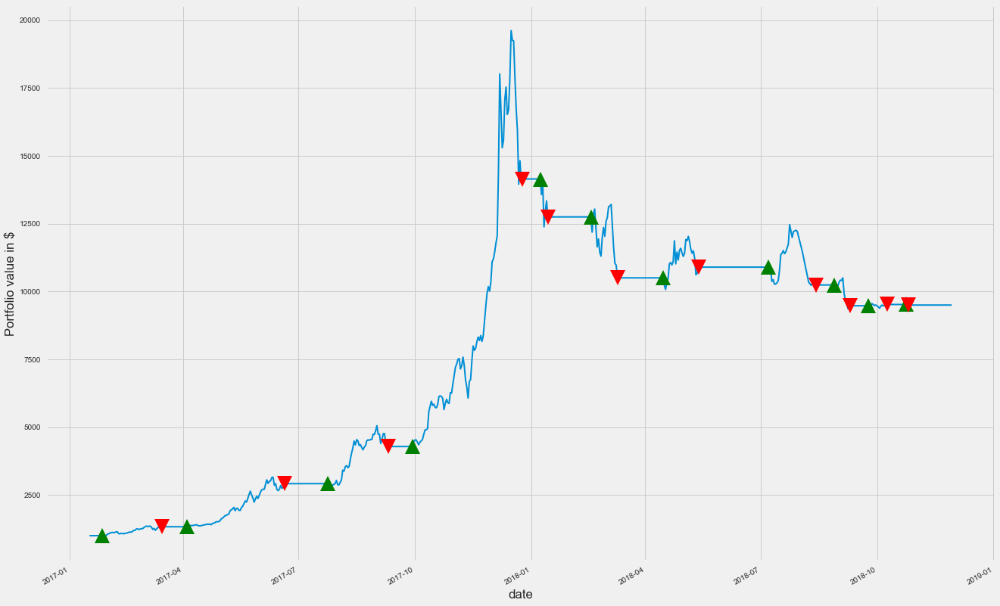

In [129]:
fig = plt.figure(figsize =(20,15))

ax1 = fig.add_subplot(111, ylabel='Portfolio value in $')

portfolio['total'].plot(ax=ax1, lw=2.)

ax1.plot(portfolio.loc[signal_df.positions == 1.0].index,portfolio.total[signal_df.positions == 1.0], '^', markersize = 20, color = 'g')

ax1.plot(portfolio.loc[signal_df.positions == -1.0].index,portfolio.total[signal_df.positions == -1.0], 'v', markersize = 20, color = 'r')

plt.show()

In [130]:
print('Portfolio Total Value as of 2018-11-29 ')
print(portfolio['total'].tail(1))

print('Absolute return as of 2018-11-29 ')

print((((portfolio['total'].tail(1)/float(1000)) - float(1))*100))

Portfolio Total Value as of 2018-11-29 
date
2018-11-29    9502.38
Name: total, dtype: float64
Absolute return as of 2018-11-29 
date
2018-11-29    850.238
Name: total, dtype: float64


***The result above shows that a trader that started with 1000 dollars in portfolio as of 2017 will have a portfolio total value of 9502.38 dollars as of 2018-11-29.***


# Using predictions to determine when to buy and to sell.

***In other to predict when to buy or sell, a logistics regression model will be built. The response variabe "change" was created by transforming "Price % change"  to binary classes of 0 and 1. class 1 indicates the new price is greater than the old price which is when to sell and class 0 indicates the new price is less than the old price and we buy in this case. See table below.***


In [131]:
notification_market_BTC[['change', 'close_daily_%_change','close']]

,change,close_daily_%_change,close
date,,,
2017-01-17,0,0.000000,907.94
2017-01-18,0,-0.023482,886.62
2017-01-19,1,0.014042,899.07
2017-01-20,0,-0.004494,895.03
2017-01-21,1,0.029898,921.79
...,...,...,...
2018-11-25,1,0.033295,4009.97
2018-11-26,0,-0.057567,3779.13
2018-11-27,1,0.011005,3820.72


In [132]:
notification_market_BTC

,market_y,high,low,open,close,volume,high_daily_%_change,low_daily_%_change,open_daily_%_change,close_daily_%_change,...,alert__daily_count_%_change,change,20_day_sma_close,Upper Band_1,Lower Band_1,Upper Band_2,Lower Band_2,Upper Band_3,Lower Band_3,COL_ZSCORE
date,,,,,,,,,,,,,,,,,,,,,
2017-01-17,1.462578e+10,910.56,830.80,830.95,907.94,1.550950e+08,0.000000,0.000000,0.000000,0.000000,...,0.000000,0,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
2017-01-18,1.428404e+10,917.50,858.30,909.37,886.62,2.256770e+08,0.007622,0.033101,0.094374,-0.023482,...,0.766667,0,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
2017-01-19,1.448662e+10,904.61,884.34,888.34,899.07,1.056250e+08,-0.014049,0.030339,-0.023126,0.014042,...,2.113208,1,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
2017-01-20,1.442355e+10,899.40,887.01,898.17,895.03,8.672840e+07,-0.005759,0.003019,0.011066,-0.004494,...,-0.484848,0,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
2017-01-21,1.485691e+10,927.37,895.53,895.55,921.79,1.111580e+08,0.031099,0.009605,-0.002917,0.029898,...,0.317647,1,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-11-25,6.974927e+10,4120.87,3585.06,3880.78,4009.97,6.825640e+09,-0.066217,-0.055360,-0.107393,0.033295,...,0.022385,1,5534.1645,6482.314893,4586.014107,7430.465286,3637.863714,8378.615678,2689.713322,-1.607545
2018-11-26,6.573929e+10,4107.14,3643.92,4015.07,3779.13,6.476900e+09,-0.003332,0.016418,0.034604,-0.057567,...,-0.344951,0,5406.4075,6411.508554,4401.306446,7416.609608,3396.205392,8421.710662,2391.104338,-1.619019
2018-11-27,6.646897e+10,3862.96,3661.01,3765.95,3820.72,5.998720e+09,-0.059453,0.004690,-0.062046,0.011005,...,-0.036835,1,5278.5545,6315.712737,4241.396263,7352.870974,3204.238026,8390.029211,2167.079789,-1.405605


# Logistics Model

In [133]:
notification_market_BTC.isnull().sum()

market_y                        0
high                            0
low                             0
open                            0
close                           0
volume                          0
high_daily_%_change             0
low_daily_%_change              0
open_daily_%_change             0
close_daily_%_change            0
volume_daily_%_change           0
market_daily_%_change           0
user_id                         0
alert_id                        0
alert__daily_count_%_change     0
change                          0
20_day_sma_close                0
Upper Band_1                    0
Lower Band_1                    0
Upper Band_2                    0
Lower Band_2                    0
Upper Band_3                    0
Lower Band_3                    0
COL_ZSCORE                     19
dtype: int64

In [134]:
X = notification_market_BTC[['high_daily_%_change','low_daily_%_change', 'volume_daily_%_change', 'alert__daily_count_%_change']]

y = notification_market_BTC[["change"]].values

In [135]:
notification_market_BTC.shape

(658, 24)

In [136]:
notification_market_BTC[["change"]].dtypes

change    int32
dtype: object

In [137]:
#Split into test and train
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

C:\Users\kakin\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


LogisticRegression()

In [138]:
y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.66


### Confusion matrix

In [139]:
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

[[ 22  65]
 [  3 108]]


In [157]:
# clf = SVC(random_state=0)
# clf.fit(X_train, y_train)
# SVC(random_state=0)
# plot_confusion_matrix(logreg, X_test, y_test)  
# plt.show()

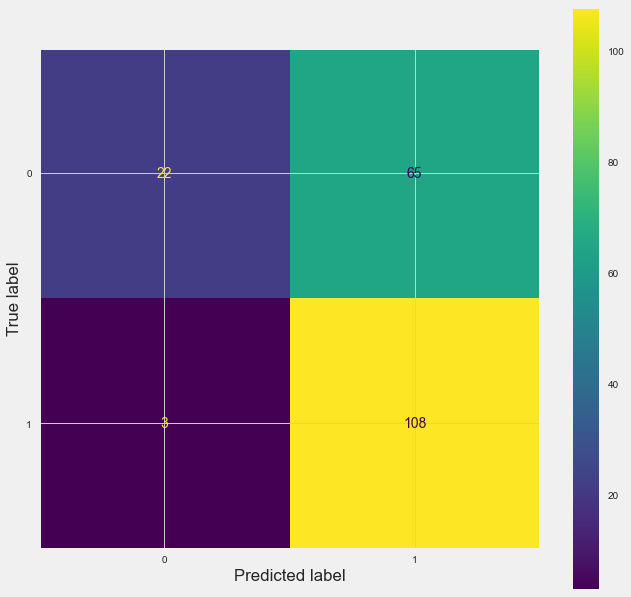

In [141]:
fig, ax = plt.subplots(figsize=(10, 10))
plot_confusion_matrix(
    logreg,  # Fitted estimator (it must have been fit)
    X_test,
    y_test,  # test sets
    ax=ax,
);

## Closer look at other metrics

In [142]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.88      0.25      0.39        87
           1       0.62      0.97      0.76       111

    accuracy                           0.66       198
   macro avg       0.75      0.61      0.58       198
weighted avg       0.74      0.66      0.60       198



## The ROC curve

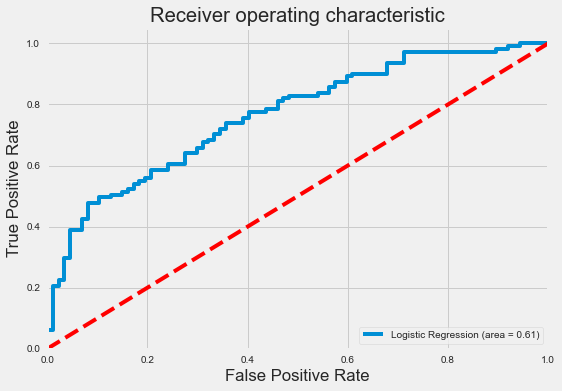

In [143]:
logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [144]:
#value counts on classes
k_2["change"].value_counts()

1    372
0    286
Name: change, dtype: int64

In [145]:
#Fitting the Logit model
logit_model=sm.Logit(y,X)
result=logit_model.fit()
print(result.summary2())

Optimization terminated successfully.
         Current function value: 0.539455
         Iterations 7
                              Results: Logit
Model:                  Logit               Pseudo R-squared:    0.212     
Dependent Variable:     y                   AIC:                 717.9227  
Date:                   2021-10-07 01:41    BIC:                 735.8795  
No. Observations:       658                 Log-Likelihood:      -354.96   
Df Model:               3                   LL-Null:             -450.45   
Df Residuals:           654                 LLR p-value:         3.7365e-41
Converged:              1.0000              Scale:               1.0000    
No. Iterations:         7.0000                                             
---------------------------------------------------------------------------
                             Coef.  Std.Err.    z    P>|z|   [0.025  0.975]
---------------------------------------------------------------------------
high_daily_%_chan

In [146]:
notification_market_BTC["alert_id"].describe()

count      658.000000
mean      3807.489362
std       3551.376955
min         30.000000
25%        980.750000
50%       2549.000000
75%       5577.500000
max      21306.000000
Name: alert_id, dtype: float64

## Logistic Model with only the market data

In [149]:
X = notification_market_BTC[['high_daily_%_change','low_daily_%_change', 'volume_daily_%_change']]

y = notification_market_BTC[["change"]].values

In [150]:
#Split into test and train
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

C:\Users\kakin\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


LogisticRegression()

In [151]:
y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.64


C:\Users\kakin\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


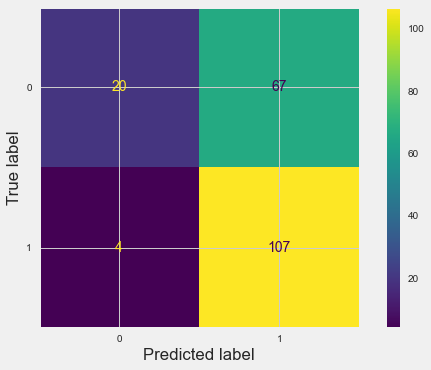

In [152]:
clf = SVC(random_state=0)
clf.fit(X_train, y_train)
SVC(random_state=0)
plot_confusion_matrix(logreg, X_test, y_test)  
plt.show()

In [153]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.83      0.23      0.36        87
           1       0.61      0.96      0.75       111

    accuracy                           0.64       198
   macro avg       0.72      0.60      0.56       198
weighted avg       0.71      0.64      0.58       198



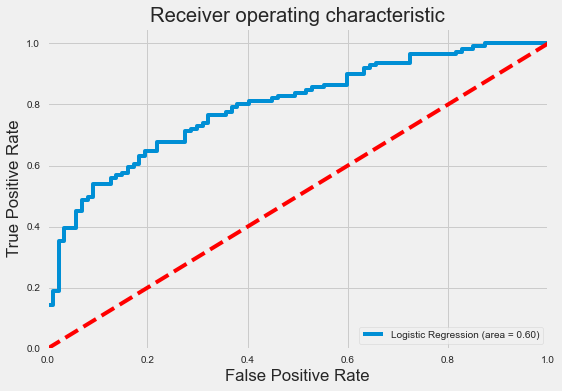

In [154]:
logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [155]:
#Fitting the Logit model
logit_model=sm.Logit(y,X)
result=logit_model.fit()
print(result.summary2())

Optimization terminated successfully.
         Current function value: 0.542390
         Iterations 7
                           Results: Logit
Model:               Logit             Pseudo R-squared:  0.208     
Dependent Variable:  y                 AIC:               719.7848  
Date:                2021-10-07 01:41  BIC:               733.2524  
No. Observations:    658               Log-Likelihood:    -356.89   
Df Model:            2                 LL-Null:           -450.45   
Df Residuals:        655               LLR p-value:       2.3250e-41
Converged:           1.0000            Scale:             1.0000    
No. Iterations:      7.0000                                         
--------------------------------------------------------------------
                       Coef.  Std.Err.   z    P>|z|   [0.025  0.975]
--------------------------------------------------------------------
high_daily_%_change    8.3418   3.9419 2.1162 0.0343  0.6159 16.0678
low_daily_%_change    28.506

***The accuracy is 64 percent in this case which implies that the model with alert feature is slightly better. This also shows that the logistic regression model outperformed the linear regression model with accuracy rate of 66 percent for the model with alert feature.*** 


# Conclusion

The project successfully itemized some trading strategies that can lead bitcoin traders to the right path. The bollinger bands, Z-score and the simple moving average crossover(SMAC) were shown to be effective in trading bitcoin as you are likely to yield maximize return on investment capital and make better trading decisions if these strategies are incorprated in trading. Just as the result in the trading strategy shows that a trader that started with 1000 dollars in portfolio as of 2017 will have a portfolio total value of 9502.38 dollars as of 2018-11-29. Logistic and linear regression models were also evaluated to predict when to buy or sell a bitcoin. It was seen that the logistic regression model with alert feature outperformed the linear regression with alert feature with 66% accuracy versus 36.5%. This implies that users' notification and alert activity slightly influence the price.